<a href="https://colab.research.google.com/github/Yeehui13/Automated-Trading/blob/main/Assignment_Lim_Yee_Hui.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import io
from pylab import mpl, plt
from sklearn.preprocessing import LabelEncoder
plt.style.use("seaborn")
mpl.rcParams["font.family"] = "serif"
%config InlineBackend.figure_format = "svg"
import seaborn as sns
import matplotlib.pyplot as plt

<ipython-input-2-6a3cc1018a7c>:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving The Trends and Pattern of Tobacco Company Sales to Perform Forecasting and Optimization Analysis.csv to The Trends and Pattern of Tobacco Company Sales to Perform Forecasting and Optimization Analysis.csv


##Data Import & Preprocessing

In [ ]:
df = pd.read_csv(io.StringIO(uploaded["The Trends and Pattern of Tobacco Company Sales to Perform Forecasting and Optimization Analysis.csv"].decode("utf-8")), header=0)

In [ ]:
df = pd.read_csv(io.StringIO(uploaded["The Trends and Pattern of Tobacco Company Sales to Perform Forecasting and Optimization Analysis.csv"].decode("utf-8")), header=0)

In [ ]:
df = pd.read_csv("The Trends and Pattern of Tobacco Company Sales to Perform Forecasting and Optimization Analysis.csv")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20774 entries, 0 to 20773
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   invoiceID     20774 non-null  object
 1   invoice_date  20774 non-null  object
 2   customerID    20774 non-null  int64 
 3   country       20774 non-null  object
 4   quantity      20774 non-null  int64 
 5   revenue       20774 non-null  object
dtypes: int64(2), object(4)
memory usage: 973.9+ KB


In [ ]:
df.head()

,invoiceID,invoice_date,customerID,country,quantity,revenue
0,536365,12/1/2020 8:26,17850,United Kingdom,40,"139,12"
1,536366,12/1/2020 8:28,17850,United Kingdom,12,"22,20"
2,536367,12/1/2020 8:34,13047,United Kingdom,83,"278,73"
3,536368,12/1/2020 8:34,13047,United Kingdom,15,"70,05"
4,536369,12/1/2020 8:35,13047,United Kingdom,3,"17,85"


In [ ]:
df.tail()

,invoiceID,invoice_date,customerID,country,quantity,revenue
20769,581586,12/9/2021 12:49,13113,United Kingdom,66,"339,20"
20770,581587,12/9/2021 12:50,12680,France,105,"249,45"
20771,A563185,8/12/2021 14:50,16593,United Kingdom,1,"11062,06"
20772,A563186,8/12/2021 14:51,10983,United Kingdom,1,"-11062,06"
20773,A563187,8/12/2021 14:52,13678,United Kingdom,1,"-11062,06"


In [ ]:
df.revenue = df.revenue.astype(str).str.replace(',','')

In [ ]:
df.head()

,invoiceID,invoice_date,customerID,country,quantity,revenue
0,536365,12/1/2020 8:26,17850,United Kingdom,40,"139,12"
1,536366,12/1/2020 8:28,17850,United Kingdom,12,"22,20"
2,536367,12/1/2020 8:34,13047,United Kingdom,83,"278,73"
3,536368,12/1/2020 8:34,13047,United Kingdom,15,"70,05"
4,536369,12/1/2020 8:35,13047,United Kingdom,3,"17,85"


##EDA

In [ ]:
df.describe().round(2)

,customerID,quantity
count,20774.00,20774.00
mean,15239.70,272.53
std,1931.58,942.79
min,10001.00,1.00
25%,13694.00,63.00
50%,15176.50,145.00
75%,16839.00,288.00
max,19990.00,80995.00


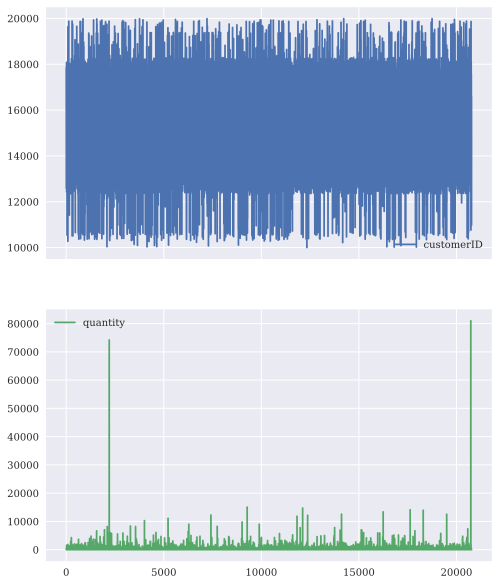

In [ ]:
df.plot(figsize=(8, 10),subplots=True);
#all above is preprocessing

In [ ]:
df.shape

(20774, 6)

<ipython-input-14-6c43860d8316>:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


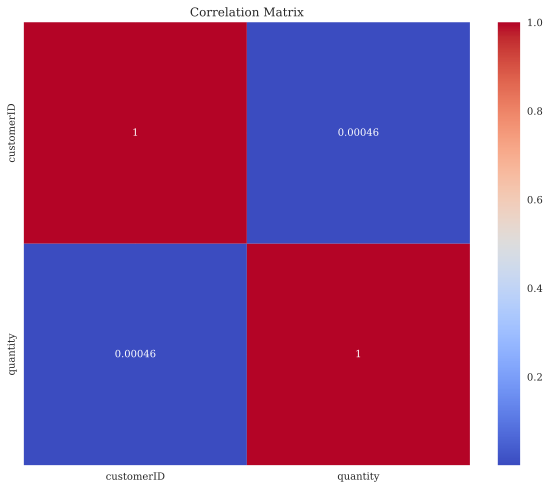

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df'

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a figure and set its size
plt.figure(figsize=(10, 8))

# Create the heatmap using seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Set the title of the heatmap
plt.title('Correlation Matrix')

# Display the heatmap
plt.show()

#Feature Engineering

In [ ]:
features_column = ["invoiceID", "invoice_date", "customerID", "quantity", "country"]
x = df[features_column].values
y = df["revenue"].values


In [ ]:
le = LabelEncoder()
z = le.fit_transform(df["quantity"])

In [ ]:
print(z)

[39 11 82 ...  0  0  0]


In [ ]:
df.head()

,invoiceID,invoice_date,customerID,country,quantity,revenue
0,536365,12/1/2020 8:26,17850,United Kingdom,40,"139,12"
1,536366,12/1/2020 8:28,17850,United Kingdom,12,"22,20"
2,536367,12/1/2020 8:34,13047,United Kingdom,83,"278,73"
3,536368,12/1/2020 8:34,13047,United Kingdom,15,"70,05"
4,536369,12/1/2020 8:35,13047,United Kingdom,3,"17,85"


In [ ]:
# Create a DataFrame with the data and specify the column names
df = pd.DataFrame(df, columns=["revenue", "quantity"])

# Convert "revenue" column to int64
df["revenue"] = pd.to_numeric(df["revenue"], errors="coerce")

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Apply label encoding to the "country" column
df["quantity"] = label_encoder.fit_transform(df["quantity"])

# Display the "revenue" column
print(df)

       revenue  quantity
0          NaN        39
1          NaN        11
2          NaN        82
3          NaN        14
4          NaN         2
...        ...       ...
20769      NaN        65
20770      NaN       104
20771      NaN         0
20772      NaN         0
20773      NaN         0

[20774 rows x 2 columns]


In [ ]:
df.head()

,revenue,quantity
0,NaN,39
1,NaN,11
2,NaN,82
3,NaN,14
4,NaN,2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20774 entries, 0 to 20773
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   revenue   0 non-null      float64
 1   quantity  20774 non-null  int64  
dtypes: float64(1), int64(1)
memory usage: 324.7 KB


In [ ]:
# Assuming you have a DataFrame named 'df' with 'quantity' and 'revenue' columns

# Add a new column 'total_amount' by multiplying 'quantity' and 'revenue'
df['total_amount'] = df['revenue'] / df['quantity']

# Display the updated DataFrame with the new 'total_amount' column
print(df)

       revenue  quantity  total_amount
0          NaN        39           NaN
1          NaN        11           NaN
2          NaN        82           NaN
3          NaN        14           NaN
4          NaN         2           NaN
...        ...       ...           ...
20769      NaN        65           NaN
20770      NaN       104           NaN
20771      NaN         0           NaN
20772      NaN         0           NaN
20773      NaN         0           NaN

[20774 rows x 3 columns]


<Figure size 800x550 with 0 Axes>

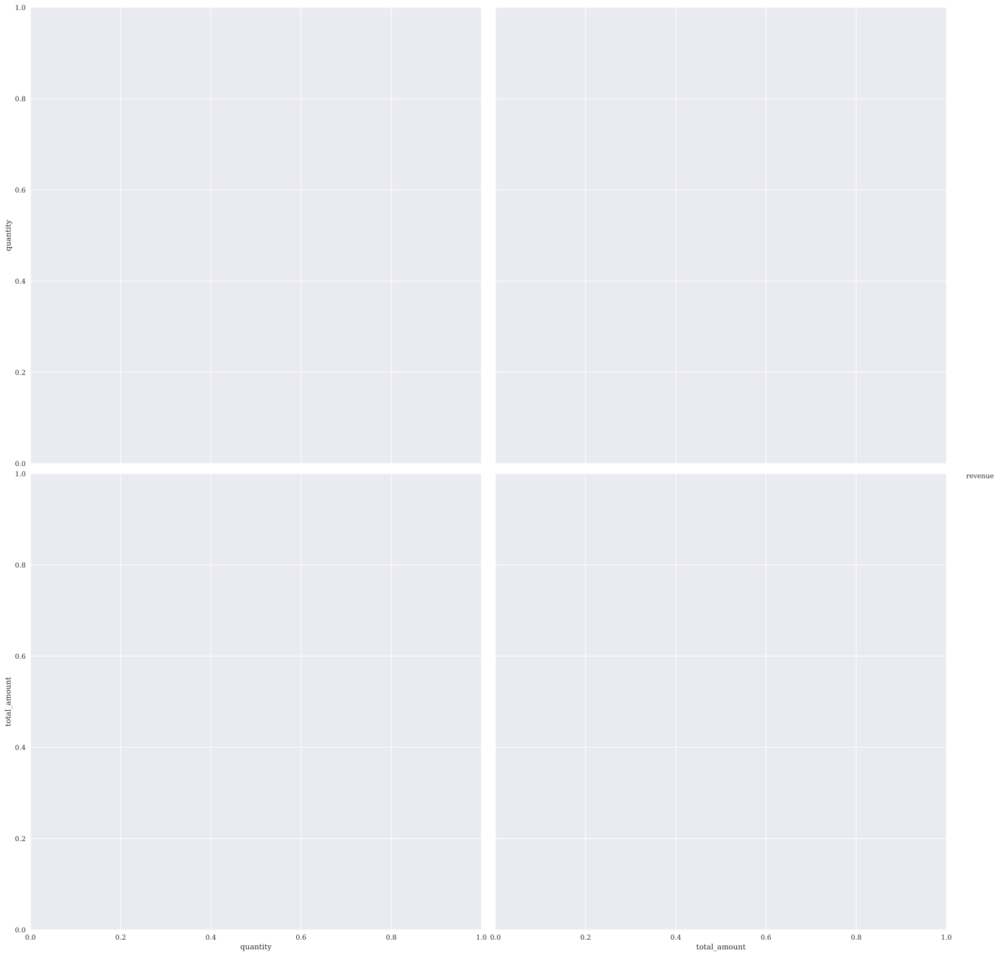

In [ ]:
from matplotlib import markers
import seaborn as sns
#import the necessary libraries
%matplotlib inline
#set the matplotlib backend to display plots inline
plt.figure()
#create a new figure
sns.pairplot(df, hue="revenue", height=10, markers=["o", "s"])
#create a pairplot using seaborn
plt.show()

Applying ML Model

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import linear_model
from sklearn.metrics import r2_score

In [ ]:
df = pd.read_csv('The Trends and Pattern of Tobacco Company Sales to Perform Forecasting and Optimization Analysis.csv')

In [ ]:
df.groupby('country').size() #EDA

country
Australia                  57
Austria                    17
Bahrain                     3
Belgium                    98
Brazil                      1
Canada                      6
Channel Islands            26
Cyprus                     16
Czech Republic              2
Denmark                    18
EIRE                      290
European Community          4
Finland                    41
France                    393
Germany                   457
Greece                      5
Hong Kong                  11
Iceland                     7
Israel                      8
Italy                      38
Japan                      20
Lebanon                     1
Lithuania                   4
Malta                       5
Netherlands                95
Norway                     36
Poland                     19
Portugal                   58
RSA                         1
Saudi Arabia                1
Singapore                   7
Spain                      90
Sweden                     36
Sw

In [ ]:
#let's select some features to explore more
df = df[["quantity", "revenue"]]

In [ ]:
# Assuming df is a pandas DataFrame containing the data
plt.scatter(df["quantity"], df["revenue"], color="pink")
plt.xlabel("Quantity")
plt.ylabel("Revenue")
plt.title("Quantity vs Revenue")
plt.show()

In [ ]:
#generating training and testing data from our data
#we are using 80% data for training
train = df[:(int((len(df)*0.8)))]
test = df[:(int((len(df)*0.8))):]

In [ ]:
#using sklearn package to model data :
regr = linear_model.LinearRegression()
train_x = np.array(train[["quantity"]])
train_y = np.array(train[["revenue"]])

regr.fit(train_x, train_y)

#the coefficients :
print ("cofficients : ",regr.coef_)
print ("Intercept : ",regr.intercept_)

ValueError: could not convert string to float: '139,12'

In [ ]:
#plotting the regression line:
plt.scatter(train["quantity"], train["revenue"], color='purple')
plt.plot(train_x, regr.coef_*train_x + regr.intercept_, '-r')
plt.xlabel("Quantity")
plt.ylabel("Revenue")

Text(0, 0.5, 'Revenue')

In [ ]:
#predicting value
#function for predicting future value:

def get_regression_predictions(input_features,intercept,slope):
    predicted_values = input_features*slope + intercept

    return predicted_values

In [ ]:
my_predicted_revenue = 3500

# Calculate estimated revenue using regression equation
estimated_revenue = get_regression_predictions(my_predicted_revenue,regr.intercept_[0],regr.coef_[0][0])

# Print the estimated revenue
print("Estimated Revenue:", estimated_revenue)

Estimated Revenue: 953384.3308974481


In [ ]:
import sklearn.metrics as metrics

test_x = np.array(test[['quantity']])
test_y = np.array(test[['revenue']])
test_y = regr.predict(test_x)

print("Mean absolute error: %.2f" % metrics.mean_absolute_error(test_y, predicted_y))
print("Mean sum of squares (MSE): %.2f" % np.mean((test_y, predicted_y)))
print("R2-score: %.2f" %r2_score(test_y, test_y))


NameError: name 'np' is not defined

In [ ]:
from sklearn.model_selection import train_test_split
train_x, test_y, train_y, test_y = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [ ]:
# Import the KNeighborsClassifier class from sklearn.neighbors
from sklearn.neighbors import KNeighborsClassifier
# Import the confusion_matrix and accuracy_score functions from sklearn.metrics
from sklearn.metrics import confusion_matrix, accuracy_score
# Import the cross_val_score function from sklearn.model_selection
from sklearn.model_selection import cross_val_score

#instancetite learning model
classifier = KNeighborsClassifier(n_neighbors=3)

#fitting the model
classifier.fit(train_x, train_y)

#predicting the test set results
y_pred = classifier.predict(test_x)

ValueError: could not convert string to float: '9/29/2021 16:44'